In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0


In [3]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-uf94l8qm
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-uf94l8qm
  Resolved https://github.com/facebookresearch/detectron2.git to commit 3c7bb714795edc7a96c9a1a6dd83663ecd293e36
  Preparing metadata (setup.py) ... done


In [4]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)


nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
detectron2: 0.6


In [5]:
import numpy as np
import pandas as pd
import torch
import os
import random

import matplotlib.pyplot as plt
from matplotlib import patches
import seaborn as sns
%matplotlib inline

import cv2
import itertools
import copy


import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader, build_detection_train_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.structures import BoxMode
import detectron2.data.transforms as T
from detectron2.data import detection_utils as utils

In [6]:
# COMMON LIBRARIES
import os
import cv2

from datetime import datetime
from google.colab.patches import cv2_imshow

# DATA SET PREPARATION AND LOADING
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog

# VISUALIZATION
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

# CONFIGURATION
from detectron2 import model_zoo
from detectron2.config import get_cfg

# EVALUATION
from detectron2.engine import DefaultPredictor

# TRAINING
from detectron2.engine import DefaultTrainer

   <div style="text-align: right; direction: rtl; ">
   <font size="5">دیتاست:</font>

   <font size="3">برای دیتاست از تصاویر دیتاست LateBlightDisease سایت robofolowاستفاده شده است،</font>

   <font size="3">برای بعضی از تصاویر که فاقد annotation بودند ،annotation اضافه شد. </font>
   <font size="3">سایز تصاویر به 512*512 تغیر داده شدند . و همچنین 10 درصد داده ها برای تست و 20 درصد برای اعتبار سنجی و
    باقی داده ها برای اموزش جدا شدند</font>

   <font size="4">برای جلوگیری از  اورفیت شدن مدل و همچین  داده افزایی از تکینک های زیر برای داده افزایی استفاده شده است:</font>

   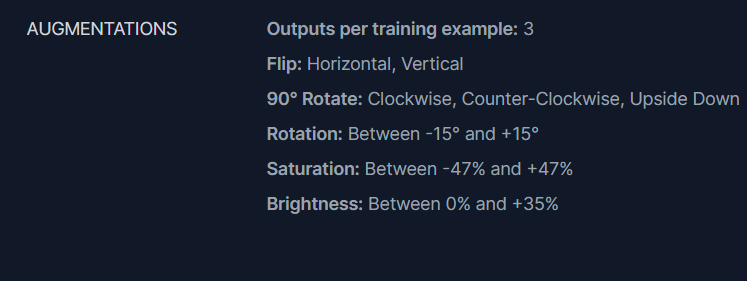

   <font size="3">در نهایت حدود 400 داده برای که برای اموزش جدا شده بود، با اعمال تکنیک های داده افزایی به 800 داده افزایش یافتند</font>
   <font size="3">دیتاست در لینک زیر قابل مشاهده است از ورژن یک استفاده شده است.

   https://universe.roboflow.com/itosoft/late-blight-disease-fztts/dataset/1
   </font>

   </div>

In [7]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="qYXHtQH5fOmdrA63xRxR")
project = rf.workspace("itosoft").project("late-blight-disease-fztts")
dataset = project.version(1).download("coco-segmentation")



Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Late-Blight-Disease-1 in coco-segmentation:: 100%|██████████| 1013/1013 [00:01<00:00, 897.38it/s]


In [8]:
DATA_SET_NAME = dataset.name.replace(" ", "-")
ANNOTATIONS_FILE_NAME = "_annotations.coco.json"

In [9]:
# TRAIN SET
TRAIN_DATA_SET_NAME = f"{DATA_SET_NAME}-train"
TRAIN_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "train")
TRAIN_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "train", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=TRAIN_DATA_SET_NAME, 
    metadata={}, 
    json_file=TRAIN_DATA_SET_ANN_FILE_PATH, 
    image_root=TRAIN_DATA_SET_IMAGES_DIR_PATH
)

# TEST SET
TEST_DATA_SET_NAME = f"{DATA_SET_NAME}-test"
TEST_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "test")
TEST_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "test", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=TEST_DATA_SET_NAME, 
    metadata={}, 
    json_file=TEST_DATA_SET_ANN_FILE_PATH, 
    image_root=TEST_DATA_SET_IMAGES_DIR_PATH
)

# VALID SET
VALID_DATA_SET_NAME = f"{DATA_SET_NAME}-valid"
VALID_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "valid")
VALID_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "valid", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=VALID_DATA_SET_NAME, 
    metadata={}, 
    json_file=VALID_DATA_SET_ANN_FILE_PATH, 
    image_root=VALID_DATA_SET_IMAGES_DIR_PATH
)

In [10]:

print(f'Total number of test images: {len(os.listdir(VALID_DATA_SET_IMAGES_DIR_PATH))}')

Total number of test images: 84


In [11]:
VALID_DATA_SET_ANN_FILE_PATH

'/content/Late-Blight-Disease-1/valid/_annotations.coco.json'

In [12]:
[
    data_set
    for data_set
    in MetadataCatalog.list()
    if data_set.startswith(DATA_SET_NAME)
]

['Late-Blight-Disease-train',
 'Late-Blight-Disease-test',
 'Late-Blight-Disease-valid']

WARNING [05/28 11:55:10 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/28 11:55:10 d2.data.datasets.coco]: Loaded 879 images in COCO format from /content/Late-Blight-Disease-1/train/_annotations.coco.json


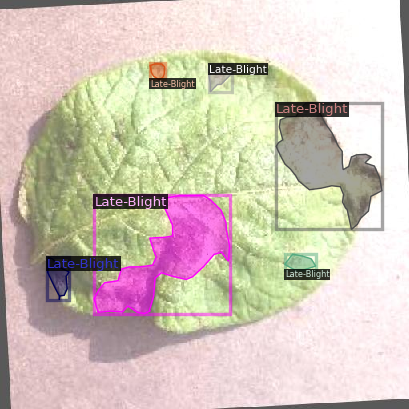

In [13]:
metadata = MetadataCatalog.get(TRAIN_DATA_SET_NAME)
dataset_train = DatasetCatalog.get(TRAIN_DATA_SET_NAME)

dataset_entry = dataset_train[1]
image = cv2.imread(dataset_entry["file_name"])

visualizer = Visualizer(
    image[:, :, ::-1],
    metadata=metadata, 
    scale=0.8, 
    instance_mode=ColorMode.IMAGE_BW
)

out = visualizer.draw_dataset_dict(dataset_entry)
cv2_imshow(out.get_image()[:, :, ::-1])

   <div style="text-align: right; direction: rtl; ">
   <font size="5">تنظیم هایپر پارامتر ها:</font>
   
   <font size="3"> از بین مدل های COCO Instance Segmentation Baselines with Mask R-CNN با توجه به کم بودن دیتاهای اموزشی و جلوگیری از پیش برازش مدل از مدل mask_rcnn_R_50_FPN_3x استفاده شده است. که عملکرد مناسبی برروی داده های اموزشی و اعتبارسنجی دارد
  </font>

   <font size="3"> با ازمایش و  کم و زیاد کردن نرخ یادگیری، نرخ یادگیری مقدار BASE_LR = 0.0005 تعین شد .
  </font>

   <font size="3"> همچین سایر تصاویر 512*512 تعین شدند تا مدل بتواند ویژگی های مهم تصاویر زا استخراج کند و هم سرعت اموزش در حد معقول باشد
  </font>
 
   </div>

In [14]:
# HYPERPARAMETERS
Models=["mask_rcnn_R_50_FPN_3x",'mask_rcnn_R_101_FPN_3x','mask_rcnn_X_101_32x8d_FPN_3x'] 
ARCHITECTURE =Models[0]
CONFIG_FILE_PATH = f"COCO-InstanceSegmentation/{ARCHITECTURE}.yaml"
MAX_ITER = 5000
EVAL_PERIOD = 200
BASE_LR = 0.0005
NUM_CLASSES = 2
DRIVE_PATH='/content/drive/MyDrive/late-blight-disease '
# OUTPUT DIR
OUTPUT_DIR_PATH = os.path.join(
    DRIVE_PATH,
    DATA_SET_NAME, 
    ARCHITECTURE, 
    datetime.now().strftime('%Y-%m-%d-%H-%M-%S')
)

os.makedirs(OUTPUT_DIR_PATH, exist_ok=True)

In [15]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(CONFIG_FILE_PATH))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(CONFIG_FILE_PATH)
cfg.DATASETS.TRAIN = (TRAIN_DATA_SET_NAME,)
cfg.DATASETS.TEST = (TEST_DATA_SET_NAME,)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.TEST.EVAL_PERIOD = EVAL_PERIOD
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.INPUT.MASK_FORMAT='bitmask'
cfg.SOLVER.BASE_LR = BASE_LR
cfg.SOLVER.MAX_ITER = MAX_ITER
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES
cfg.OUTPUT_DIR = OUTPUT_DIR_PATH

In [16]:
# import detectron2.data.transforms as T
# from detectron2.data import DatasetMapper   # the default mapper

# dataloader = build_detection_train_loader(cfg,
#    mapper=DatasetMapper(cfg, is_train=True, augmentations=[
#       T.Resize((128, 128))
#    ]))

In [17]:
trainer = DefaultTrainer(cfg) 
#trainer.data_loader =dataloader
trainer.resume_or_load(resume=False)
trainer.train()

[05/28 11:55:12 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[05/28 11:55:12 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)


[05/28 11:55:21 d2.utils.events]:  eta: 0:30:19  iter: 19  total_loss: 2.562  loss_cls: 0.9956  loss_box_reg: 0.7104  loss_mask: 0.6908  loss_rpn_cls: 0.1327  loss_rpn_loc: 0.01634    time: 0.3645  last_time: 0.3505  data_time: 0.0302  last_data_time: 0.0121   lr: 9.9905e-06  max_mem: 1765M
[05/28 11:55:36 d2.utils.events]:  eta: 0:30:14  iter: 39  total_loss: 2.397  loss_cls: 0.8237  loss_box_reg: 0.6633  loss_mask: 0.6847  loss_rpn_cls: 0.1348  loss_rpn_loc: 0.0191    time: 0.3718  last_time: 0.3022  data_time: 0.0188  last_data_time: 0.0070   lr: 1.998e-05  max_mem: 1765M
[05/28 11:55:43 d2.utils.events]:  eta: 0:29:57  iter: 59  total_loss: 2.382  loss_cls: 0.6641  loss_box_reg: 0.7329  loss_mask: 0.673  loss_rpn_cls: 0.2072  loss_rpn_loc: 0.02255    time: 0.3630  last_time: 0.2844  data_time: 0.0154  last_data_time: 0.0084   lr: 2.997e-05  max_mem: 1766M
[05/28 11:55:50 d2.utils.events]:  eta: 0:29:47  iter: 79  total_loss: 2.074  loss_cls: 0.5388  loss_box_reg: 0.7601  loss_mask:

In [21]:
OUTPUT_DIR_PATH

'/content/drive/MyDrive/late-blight-disease /Late-Blight-Disease/mask_rcnn_R_50_FPN_3x/2023-05-28-11-55-10'

In [47]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir $'/content/drive/MyDrive/late-blight-disease /Late-Blight-Disease/mask_rcnn_R_50_FPN_3x/2023-05-28-11-55-10'

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2023-05-28 12:53:47.262249: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.33' not found (required by /usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server)
/usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.34' not found (required by /usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server)
/usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.32' not found (required by /usr/local/lib/python3.10/dist-packages/tensorboard_data_server/bin/server)
Address already in use
Port 6006 is in use by another program. Either identify and stop that program, or start the s

In [23]:
cfg.OUTPUT_DIR

'/content/drive/MyDrive/late-blight-disease /Late-Blight-Disease/mask_rcnn_R_50_FPN_3x/2023-05-28-11-55-10'

In [24]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)

[05/28 12:30:04 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/late-blight-disease /Late-Blight-Disease/mask_rcnn_R_50_FPN_3x/2023-05-28-11-55-10/model_final.pth ...


WARNING [05/28 12:30:28 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/28 12:30:28 d2.data.datasets.coco]: Loaded 879 images in COCO format from /content/Late-Blight-Disease-1/train/_annotations.coco.json


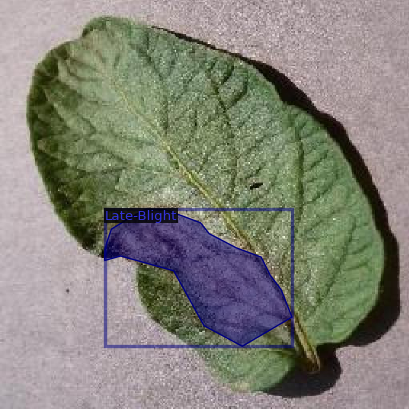

In [25]:
metadata = MetadataCatalog.get(TRAIN_DATA_SET_NAME)
dataset_train = DatasetCatalog.get(TRAIN_DATA_SET_NAME)

dataset_entry = dataset_train[10]
image = cv2.imread(dataset_entry["file_name"])

visualizer = Visualizer(
    image[:, :, ::-1],
    metadata=metadata, 
    scale=0.8, 
    instance_mode=ColorMode.IMAGE_BW
)

out = visualizer.draw_dataset_dict(dataset_entry)
cv2_imshow(out.get_image()[:, :, ::-1])

WARNING [05/28 12:30:34 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/28 12:30:34 d2.data.datasets.coco]: Loaded 43 images in COCO format from /content/Late-Blight-Disease-1/test/_annotations.coco.json


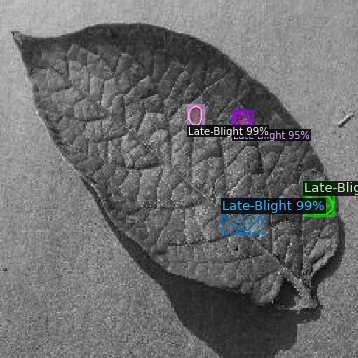

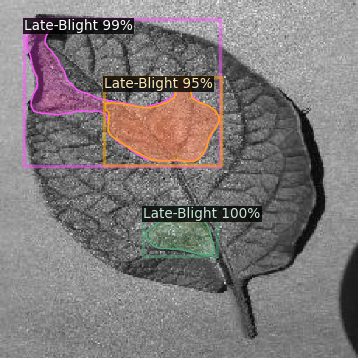

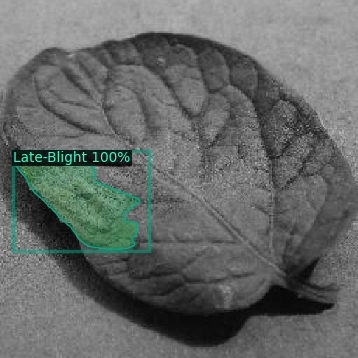

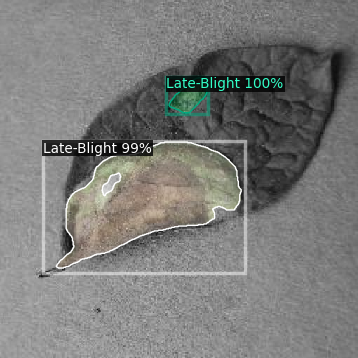

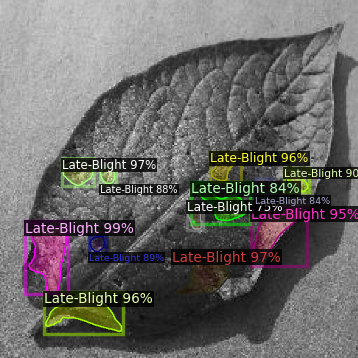

...

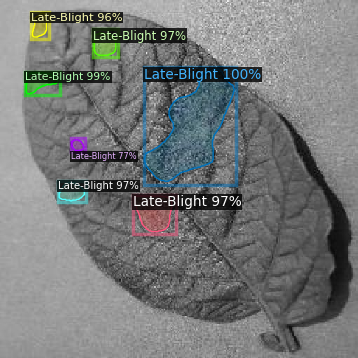

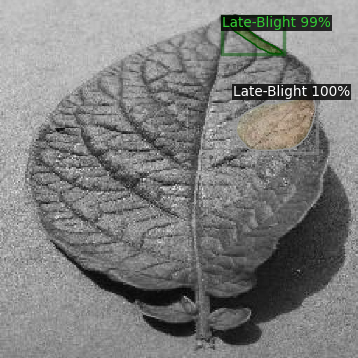

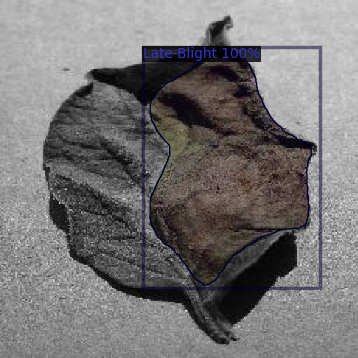

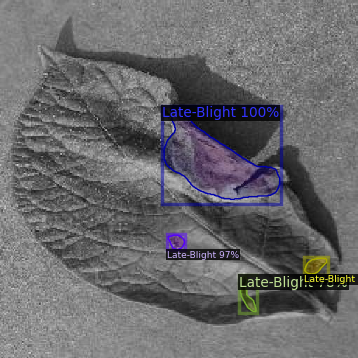

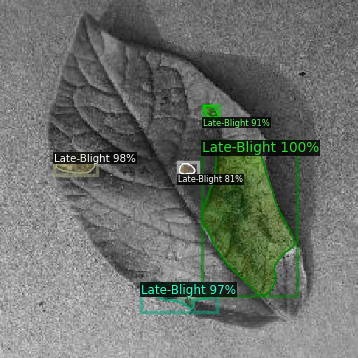

In [26]:
dataset_valid = DatasetCatalog.get(TEST_DATA_SET_NAME )

for d in dataset_valid:
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    
    visualizer = Visualizer(
        img[:, :, ::-1],
        metadata=metadata, 
        scale=0.7, 
        instance_mode=ColorMode.IMAGE_BW
    )
  
    out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [27]:
evaluator = COCOEvaluator(TRAIN_DATA_SET_NAME, cfg, False, output_dir="/content/drive/MyDrive/late-blight-disease /output_TRAIN_DATA_SET")
val_loader = build_detection_test_loader(cfg, TRAIN_DATA_SET_NAME)
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [05/28 12:31:54 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/28 12:31:54 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/28 12:31:54 d2.data.datasets.coco]: Loaded 879 images in COCO format from /content/Late-Blight-Disease-1/train/_annotations.coco.json
[05/28 12:31:54 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/28 12:31:54 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/28 12:31:54 d2.data.common]: Serializing 879 elements to byte tensors and concatenating them all ...
[05/28 12:31:54 d2.data.common]: Serialized dataset takes 1.41 MiB
[05/28 12:31:54 d2.evaluation.evaluator]: Start inference on 879 batches
[05/28 12:31

OrderedDict([('bbox',
              {'AP': 59.60464038838459,
               'AP50': 92.50944175006946,
               'AP75': 64.46008572626339,
               'APs': 24.25473340113952,
               'APm': 51.78372794961169,
               'APl': 78.88980320695025,
               'AP-Late-Blight': 59.60464038838459}),
             ('segm',
              {'AP': 50.3505099149727,
               'AP50': 89.88807721412115,
               'AP75': 49.41030975518497,
               'APs': 15.345309929652398,
               'APm': 41.43386037841524,
               'APl': 70.85833782896731,
               'AP-Late-Blight': 50.3505099149727})])

In [28]:
evaluator = COCOEvaluator(VALID_DATA_SET_NAME, cfg, False, output_dir="/content/drive/MyDrive/late-blight-disease /output_VALID_DATA_SET")
val_loader = build_detection_test_loader(cfg, VALID_DATA_SET_NAME)
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [05/28 12:33:18 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/28 12:33:18 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/28 12:33:18 d2.data.datasets.coco]: Loaded 83 images in COCO format from /content/Late-Blight-Disease-1/valid/_annotations.coco.json
[05/28 12:33:18 d2.data.build]: Distribution of instances among all 2 categories:
|  category   | #instances   |  category   | #instances   |
|:-----------:|:-------------|:-----------:|:-------------|
| Late-Blight | 0            | Late-Blight | 284          |
|             |              |             |              |
|    total    | 284          |             |              |
[05/28 12:33:18 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choi

OrderedDict([('bbox',
              {'AP': 43.048263144191075,
               'AP50': 76.45209208240861,
               'AP75': 42.0637654894639,
               'APs': 16.5857052974917,
               'APm': 33.041048668897126,
               'APl': 63.29584652240589,
               'AP-Late-Blight': 43.048263144191075}),
             ('segm',
              {'AP': 39.114641036535254,
               'AP50': 73.66755591708085,
               'AP75': 38.55176735185455,
               'APs': 10.015506816452852,
               'APm': 27.583232863189316,
               'APl': 62.734892444738264,
               'AP-Late-Blight': 39.114641036535254})])

https://drive.google.com/drive/folders/1LNNpjMmPlBlWYurlbm5syRMDBbV78OGR?usp=sharing

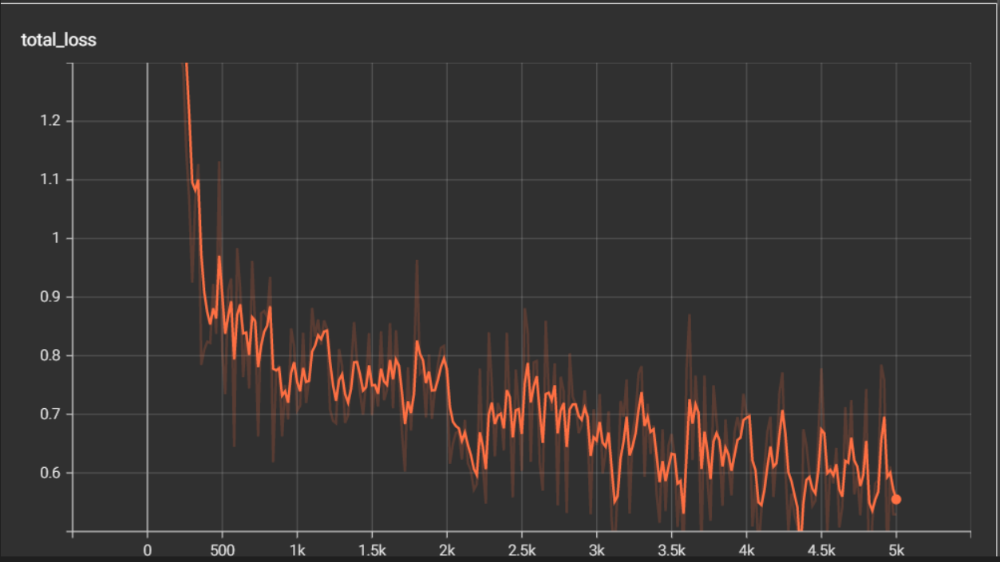

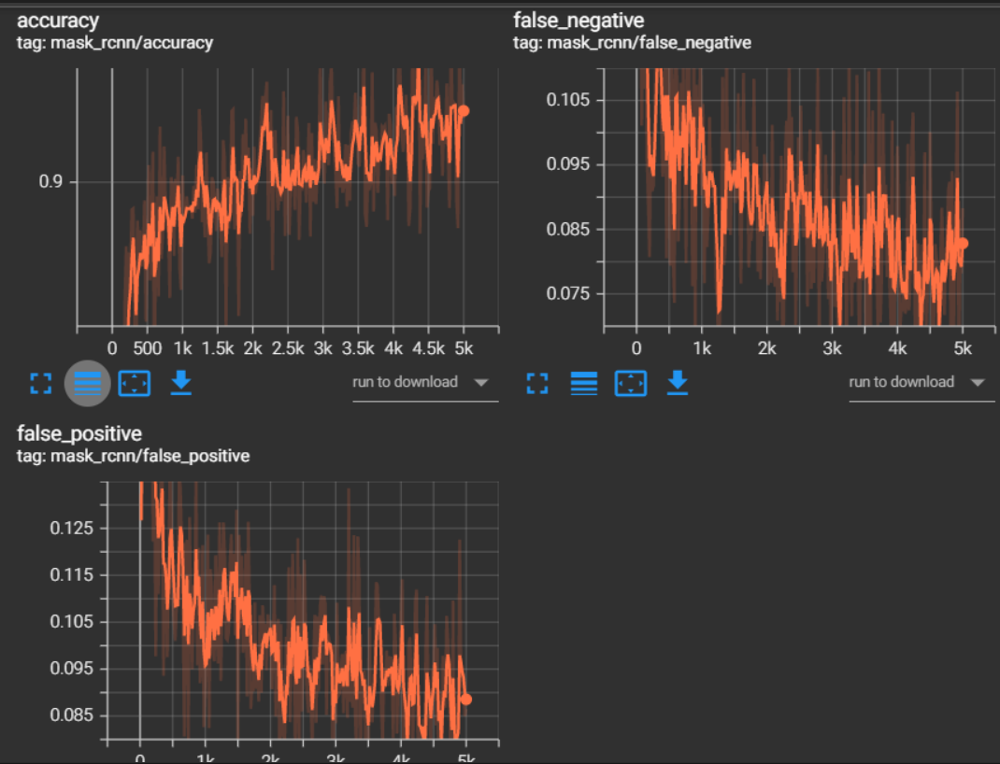

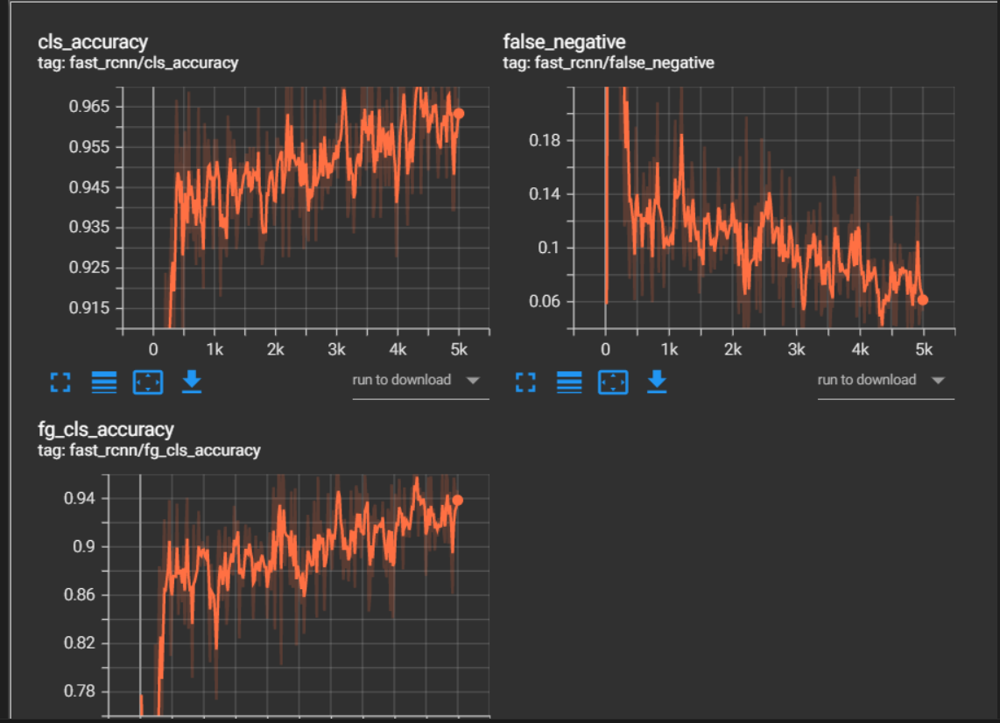